# **Wikispeedia**

O dataset escolhido contém caminhos de navegação entre links de artigos da Wikipedia, coletados através do jogo Wikispeedia. No Wikispeedia, os usuários são solicitados a navegar de um determinado artigo de origem para um determinado artigo de destino, clicando apenas nos links dos artigos. Para o presente dataset, foi selecionada uma versão condensada da Wikipedia, apenas 4.604 artigos.

---

Os nós representam os artigos da Wikipedia e as arestas representam os links entre eles.

---

Foi necessário um processo de filtragem dos nós para gerar um subgrafo devido ao tamanho e complexidade do grafo original. O grafo geral possui uma grande quantidade de nós e arestas, tornando-o pesado para rodar a parte de visualização e análise. Além disso, o grafo era desconexo, o que dificultava a interpretação e análise dos dados como um todo.

Assim, decidimos realizar uma análise e comparação em cima de um subgrafo gerado a partir do conjunto de nós do componente fortemente conexo com maior quantidade de nós (aproximadamente 88% dos nós e 93% das arestas).

**Dataset:** [wikispeedia navigation paths](https://snap.stanford.edu/data/wikispeedia.html).

[link visualizações dos dados](https://datasciencedojo.com/blog/network-theory-game-of-thrones/)

##**Setup**

In [ ]:
! pip install pyvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.2 MB/s eta 0:00:00


In [ ]:
from pyvis.network import Network
import networkx as nx
import pandas as pd

In [ ]:
! pip install nxviz

In [ ]:
! pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 107.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 21.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 110.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 35.3 MB/s eta 0:00:00
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19579 sha256=3e321162e6ab47c5526334b5c49d834243c50324085f6297ecb9b28d33efdaf8
  Stored in directory: /root/.cache/pip/wheels/f2/ed/dd/d3a556ad245ef9dc570c6bcd2f22886d17b0b408dd3bbb9ac3
Successfully built validators
  Attempting uninstall: tzlocal
    Found existing installation: tzlocal 5.0.1
    Uninstalling tzl

In [ ]:
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import nxviz as nv
import numpy as np
import streamlit as st
import streamlit.components.v1 as components

/usr/local/lib/python3.10/dist-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.4 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.4, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [ ]:
! pip install python-louvain

##**Load Data**

In [ ]:
from urllib.parse import unquote

df_articles = pd.read_csv('https://raw.githubusercontent.com/feronando/network_analysis/main/wikispeedia_paths-and-graph/articles.tsv', skiprows=11, names=["article"])

G = nx.DiGraph()
for row in df_articles.iterrows():
  G.add_node(unquote(row[1]["article"]), category=[])

In [ ]:
df_categories = pd.read_csv('https://raw.githubusercontent.com/feronando/network_analysis/main/wikispeedia_paths-and-graph/categories.tsv', encoding='utf-8', sep="\t", skiprows=12, names=["article", "category"])

for row in df_categories.iterrows():
  G.nodes[unquote(row[1]["article"])]["category"].append(unquote(row[1]["category"]))

In [ ]:
df_links = pd.read_csv('https://raw.githubusercontent.com/feronando/network_analysis/main/wikispeedia_paths-and-graph/links.tsv', encoding='utf-8', sep="\t", skiprows=12, names=["linkSource", "linkTarget"])

for row in df_links.iterrows():
  G.add_edge(unquote(row[1]["linkSource"]), unquote(row[1]["linkTarget"]))

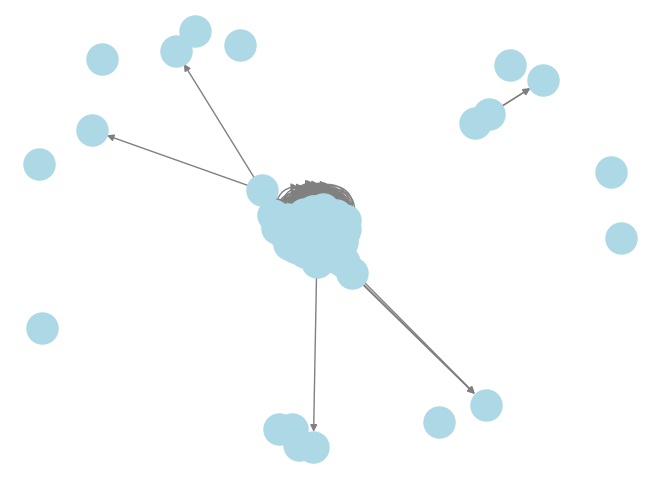

In [ ]:
nx.draw(G, node_color='lightblue', edge_color='gray', node_size=500, font_size=12)
plt.show()

In [ ]:
for n, d in G.nodes(data=True):
  G.nodes[n]["degree"] = nx.degree(G, n)
  G.nodes[n]["in_degree"] = G.in_degree(n)
  G.nodes[n]["out_degree"] = G.out_degree(n)

In [ ]:
df_articles['article'] = df_articles['article'].apply(lambda x: unquote(x))
df_links['linkSource'] = df_links['linkSource'].apply(lambda x: unquote(x))
df_links['linkTarget'] = df_links['linkTarget'].apply(lambda x: unquote(x))

In [ ]:
df_articles.to_csv("nodes", index=False)
df_links.to_csv("edges", index=False)

#**Análise Exploratória**

### Grafo Inicial

In [ ]:
print("Number of nodes: {}\nNumber of edges: {}".format(len(G.nodes), len(G.edges())))

Number of nodes: 4604
Number of edges: 119882


In [ ]:
G.nodes(data=True)

NodeDataView({'Áedán_mac_Gabráin': {'category': ['subject.History.British_History.British_History_1500_and_before_including_Roman_Britain', 'subject.People.Historical_figures'], 'degree': 11, 'in_degree': 0, 'out_degree': 11}, 'Åland': {'category': ['subject.Countries', 'subject.Geography.European_Geography.European_Countries'], 'degree': 19, 'in_degree': 0, 'out_degree': 19}, 'Édouard_Manet': {'category': ['subject.People.Artists'], 'degree': 20, 'in_degree': 0, 'out_degree': 20}, 'Éire': {'category': ['subject.Countries', 'subject.Geography.European_Geography.European_Countries'], 'degree': 8, 'in_degree': 0, 'out_degree': 8}, 'Óengus_I_of_the_Picts': {'category': ['subject.History.British_History.British_History_1500_and_before_including_Roman_Britain', 'subject.People.Historical_figures'], 'degree': 10, 'in_degree': 0, 'out_degree': 10}, '€2_commemorative_coins': {'category': ['subject.Business_Studies.Currency'], 'degree': 47, 'in_degree': 0, 'out_degree': 47}, '10th_century': {'c

## Componentes Conectados Fortemente/Fracamente

`Grafo Desconexo --> nx.is_strongly_connected(G) | nx.is_weakly_connected(G) = False`

### Componentes Conectados Fracamente

Componentes conectados fracamente em um grafo direcionado são subgrupos conectados de nós onde existe um caminho direcionado de u para v **OU** um caminho direcionado de v para u para cada par de vértices u, v.

In [ ]:
wcc = list(nx.weakly_connected_components(G))
print(f"Wikispeedia têm {len(wcc)} componentes conectados fracamente.")

Wikispeedia têm 14 componentes conectados fracamente.


In [ ]:
list(map(lambda n : len(n), wcc))

[4589, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

São eles:

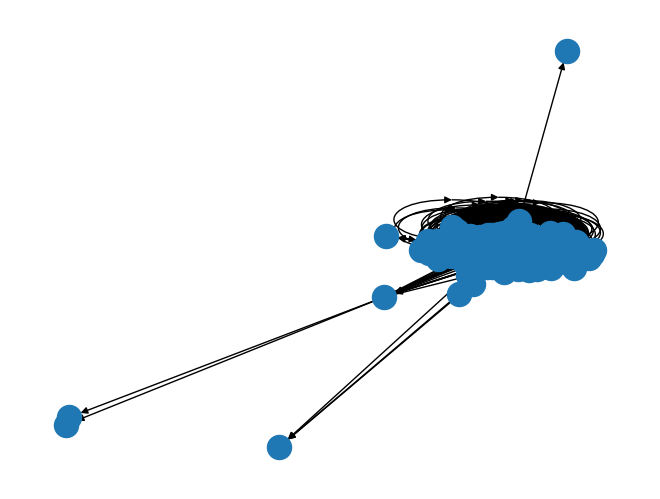

In [ ]:
nx.draw(G.subgraph(wcc[0]))

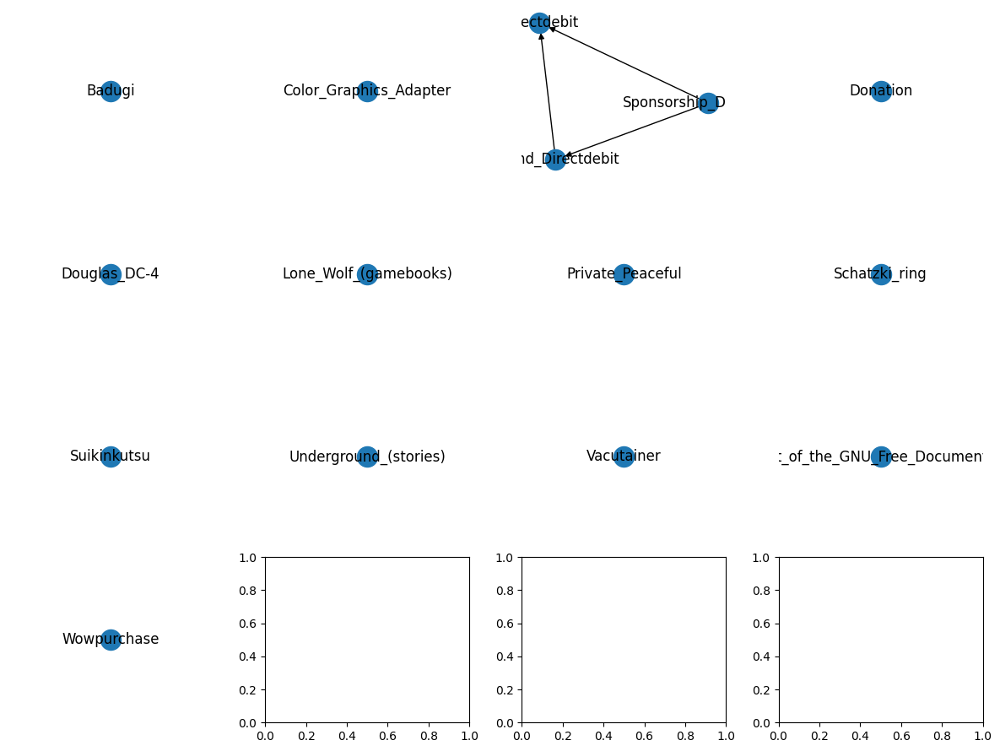

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(12, 9))
index = 1

for i, ax in enumerate(axes.flatten()):
    nx.draw(G.subgraph(wcc[index]), with_labels=True, ax=ax)
    index += 1
    if index == 14:
      break

plt.tight_layout()
plt.show()

### Componentes Conectados Fortemente

Componentes conectados fortemente em um grafo direcionado são subgrupos conectados de nós onde existe um caminho direcionado de u para v **E** um caminho direcionado de v para u para cada par de vértices u, v.

In [ ]:
scc = list(nx.strongly_connected_components(G))
print(f"Wikispeedia têm {len(scc)} componentes conectados fortemente.")

Wikispeedia têm 531 componentes conectados fortemente.


In [ ]:
pd.DataFrame(list(map(lambda n : len(n), scc))).value_counts()

1       512
2        16
3         1
6         1
4051      1
dtype: int64

Observando a descrição dos valores acima, decidimos gerar um subgrafo para análise e comparação a partir do conjunto de nós do componente fortemente conexo com maior quantidade de nós. Dessa forma, temos

In [ ]:
subgraph = G.subgraph(sorted(scc, key=lambda n : len(n), reverse=True)[0])

In [ ]:
print("Number of nodes: {}\nNumber of edges: {}".format(len(subgraph.nodes), len(subgraph.edges())))

Number of nodes: 4051
Number of edges: 111900


In [ ]:
print("% of nodes: {:.2f}%\n% of edges: {:.2f}%".format(len(subgraph.nodes)/len(G.nodes)*100, len(subgraph.edges())/len(G.edges())*100))

% of nodes: 87.99%
% of edges: 93.34%


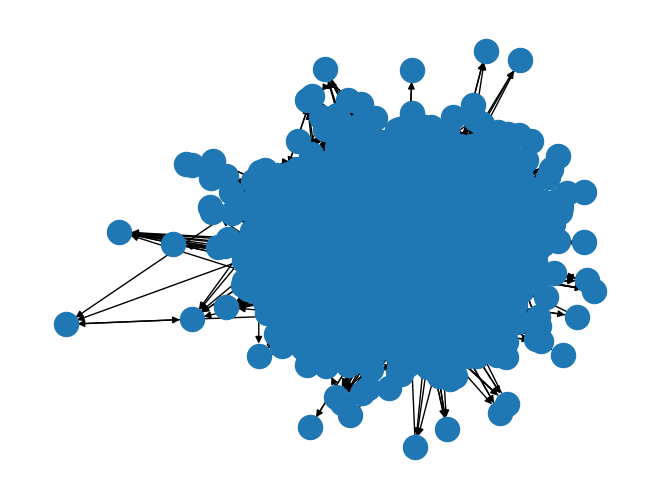

In [ ]:
nx.draw(subgraph)

In [ ]:
subgraph.nodes(data=True)

NodeDataView({'10th_century': {'category': ['subject.History.General_history'], 'degree': 91, 'in_degree': 65, 'out_degree': 26}, '11th_century': {'category': ['subject.History.General_history'], 'degree': 105, 'in_degree': 57, 'out_degree': 48}, '12th_century': {'category': ['subject.History.General_history'], 'degree': 130, 'in_degree': 85, 'out_degree': 45}, '13th_century': {'category': ['subject.History.General_history'], 'degree': 118, 'in_degree': 84, 'out_degree': 34}, '14th_century': {'category': ['subject.History.General_history'], 'degree': 102, 'in_degree': 71, 'out_degree': 31}, '15th_Marine_Expeditionary_Unit': {'category': ['subject.History.Military_History_and_War'], 'degree': 25, 'in_degree': 1, 'out_degree': 24}, '15th_century': {'category': ['subject.History.General_history'], 'degree': 157, 'in_degree': 100, 'out_degree': 57}, '16_Cygni': {'category': ['subject.Science.Physics.Space_Astronomy'], 'degree': 10, 'in_degree': 2, 'out_degree': 8}, '16_Cygni_Bb': {'categor

In [ ]:
cc = list(nx.strongly_connected_components(subgraph))
print(f"Wikispeedia têm {len(cc)} componentes conectados fortemente.")

Wikispeedia têm 1 componentes conectados fortemente.


##Comunidades da Rede

In [ ]:
from networkx.algorithms.community import greedy_modularity_communities

communities = sorted(greedy_modularity_communities(G), key=len, reverse=True)
communities

[frozenset({'Compsognathus',
            'Logic',
            'Binomial_nomenclature',
            'Eurasian_Collared_Dove',
            'Bonobo',
            'Galerina',
            'Cyclops',
            'Existentialism',
            'Fossil_fuel',
            'Snow_Goose',
            'Electric_field',
            'Nematode',
            'Bontebok',
            'Willem_Barents',
            'Seaborgium',
            'Permian',
            'Earwax',
            'Indian_Peafowl',
            'Common_Pheasant',
            'Mango',
            '55_Cancri_e',
            'Kaffir_lime',
            'Fieldfare',
            'Stegosaurus',
            'Beriberi',
            'Hymenoptera',
            'Genetics',
            'Fox',
            'Common_Cuckoo',
            'Moon',
            'Albert_Einstein',
            'Global',
            'Treecreeper',
            'Mustard_plant',
            'Apollo',
            'Aardvark',
            'Epic_of_Gilgamesh',
            'Talc',
     

In [ ]:
print(f"Wikispeedia têm {len(communities)} comunidades.")

Wikispeedia têm 24 comunidades.


In [ ]:
pd.DataFrame(list(map(lambda n : len(n), communities))).value_counts()

1       12
4        3
5        2
3        1
7        1
9        1
54       1
1410     1
1413     1
1674     1
dtype: int64

São elas

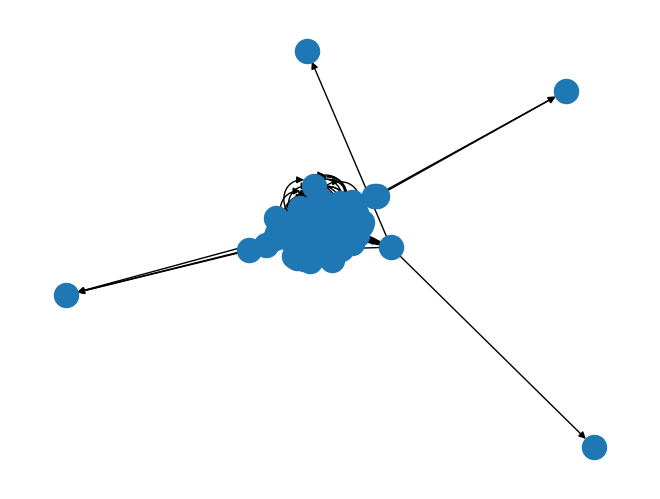

In [ ]:
nx.draw(G.subgraph(list(communities[0])))

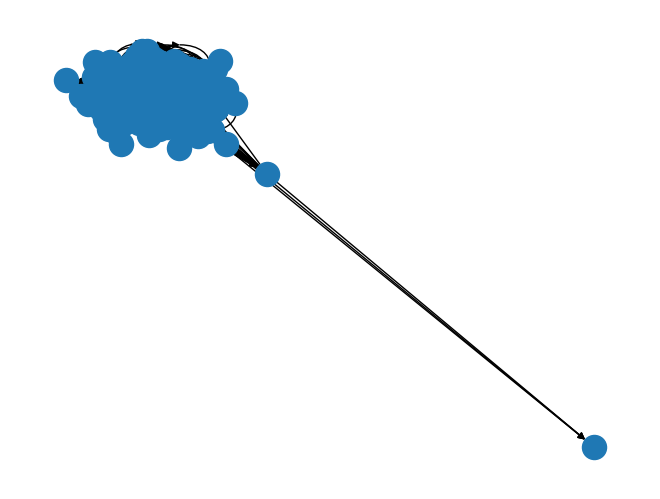

In [ ]:
nx.draw(G.subgraph(list(communities[1])))

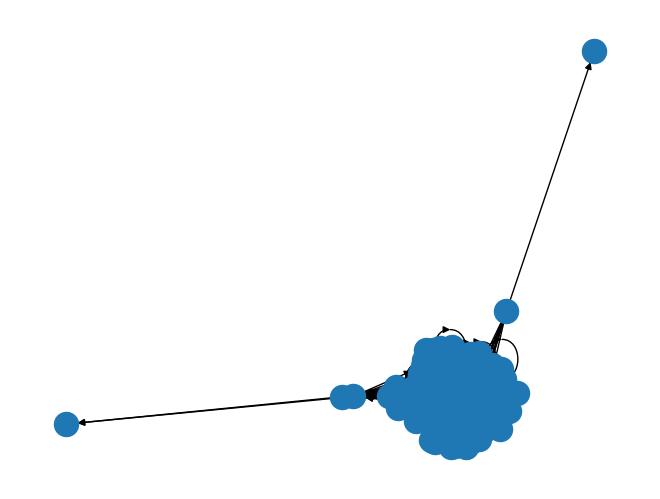

In [ ]:
nx.draw(G.subgraph(list(communities[2])))

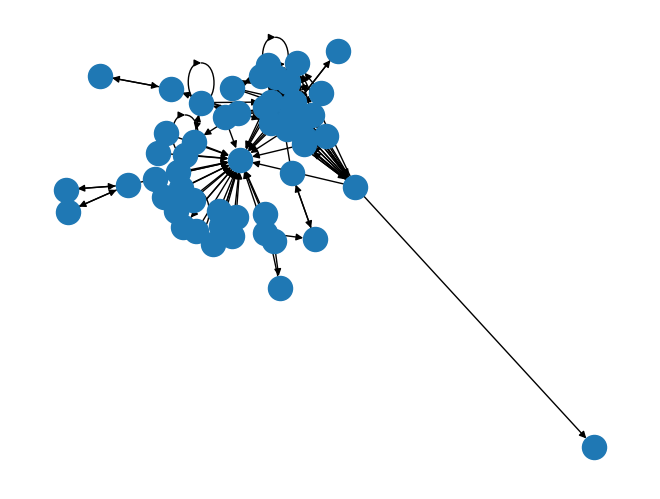

In [ ]:
nx.draw(G.subgraph(list(communities[3])))

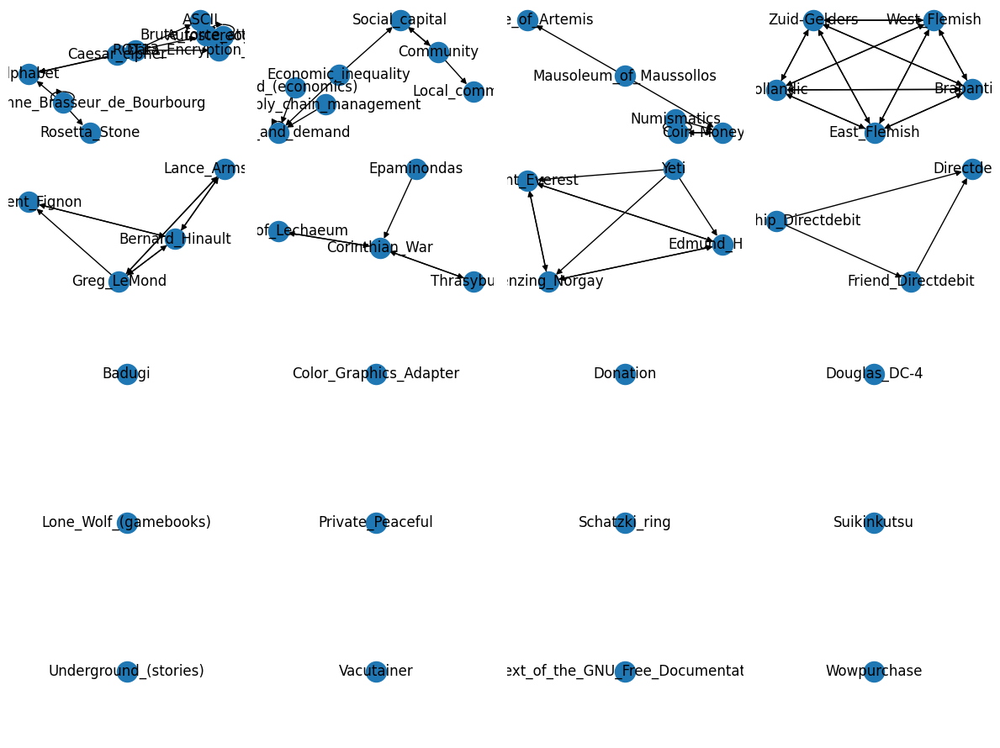

In [ ]:
fig, axes = plt.subplots(5, 4, figsize=(12, 9))
index = 4

for i, ax in enumerate(axes.flatten()):
    nx.draw(G.subgraph(list(communities[index])), with_labels=True, ax=ax)
    index += 1
    # if index == 25:
    #   break

plt.tight_layout()
plt.show()

### Subgrafo Gerado

In [ ]:
communitiesSubgraph = sorted(greedy_modularity_communities(subgraph), key=len, reverse=True)

In [ ]:
print(f"Subgrafo Gerado têm {len(communitiesSubgraph)} comunidades.")

Subgrafo Gerado têm 17 comunidades.


In [ ]:
pd.DataFrame(list(map(lambda n : len(n), communitiesSubgraph))).value_counts()

3       5
6       2
5       1
7       1
9       1
14      1
20      1
25      1
26      1
1188    1
1320    1
1410    1
dtype: int64

##Matriz de Adjacência

<Axes: >

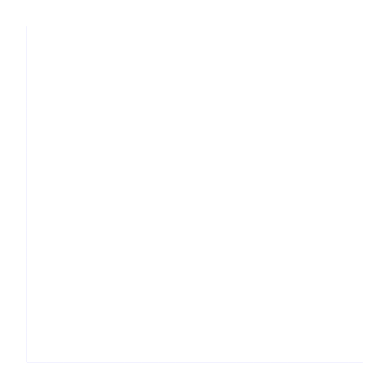

In [ ]:
nv.matrix(G)

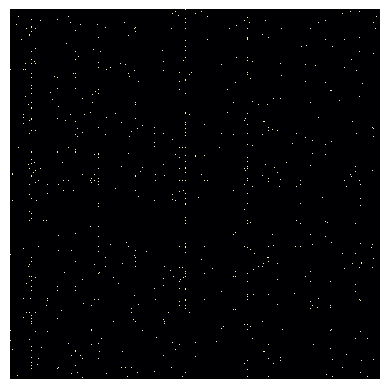

In [ ]:
m = nx.to_numpy_array(G)
plt.imshow(m, cmap='magma', interpolation='nearest')
plt.axis('off')
plt.show()

In [ ]:
nx.adjacency_matrix(G).todense()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

### Subgrafo Gerado

<Axes: >

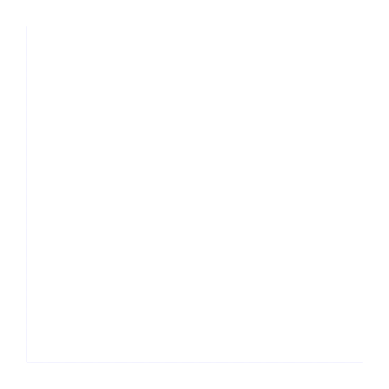

In [ ]:
nv.matrix(subgraph)

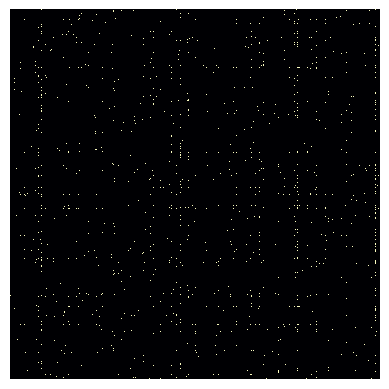

In [ ]:
m = nx.to_numpy_array(subgraph)
plt.imshow(m, cmap='magma', interpolation='nearest')
plt.axis('off')
plt.show()

In [ ]:
nx.adjacency_matrix(subgraph).todense()

array([[0, 1, 0, ..., 0, 0, 0],
       [1, 0, 1, ..., 0, 0, 0],
       [1, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

##Diâmetro e Periferia da Rede

`Grafo Desconexo --> nx.diameter(G) = ∞`

In [ ]:
diameter = max([max(j.values()) for (i,j) in nx.shortest_path_length(G)])
diameter

9

In [ ]:
periphery = []
for (i,j) in nx.shortest_path_length(G):
  if max(j.values()) == diameter:
    periphery.append(i)
periphery

['InterBase', 'Scheme_programming_language', 'X_Window_core_protocol']

### Subgrafo Gerado

`nx.is_strongly_connected(subgraph) = True`

In [ ]:
nx.is_strongly_connected(subgraph)

True

In [ ]:
diameterSubgraph = nx.diameter(subgraph)
diameterSubgraph

9

In [ ]:
peripherySubgraph = nx.periphery(subgraph)
peripherySubgraph

['Scheme_programming_language']

##Histograma de Distribuição Empírica de Grau

In [ ]:
def ecdf(data):
    return np.sort(data), np.arange(1, len(data) + 1) / len(data)

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], dict(nx.degree(G)).items()))).describe()

,0
count,4604.000000
mean,52.077324
std,78.551771
min,0.000000
25%,16.000000
50%,30.000000
75%,59.000000
max,1845.000000


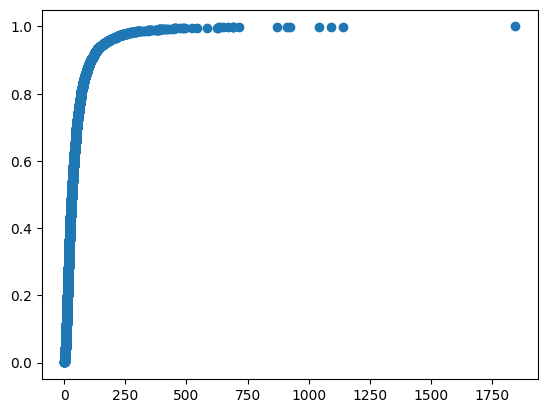

In [ ]:
x, y = ecdf(pd.Series(dict(nx.degree(G))))
plt.scatter(x, y)

<Axes: ylabel='Count'>

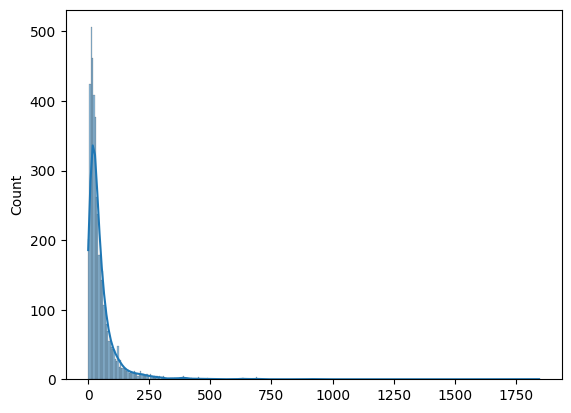

In [ ]:
import seaborn as sns
degree = [drg for node , drg in G.degree()]
sns.histplot(data=degree, kde=True)

### Subgrafo Gerado

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], dict(nx.degree(subgraph)).items()))).describe()

,0
count,4051.000000
mean,55.245618
std,77.134247
min,2.000000
25%,19.000000
50%,34.000000
75%,63.000000
max,1689.000000


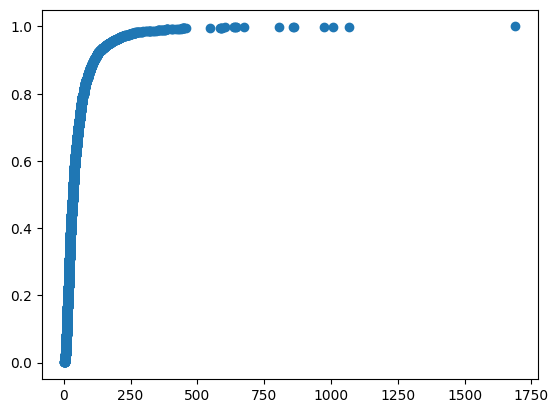

In [ ]:
xs, ys = ecdf(pd.Series(dict(nx.degree(subgraph))))
plt.scatter(xs, ys)

<Axes: ylabel='Count'>

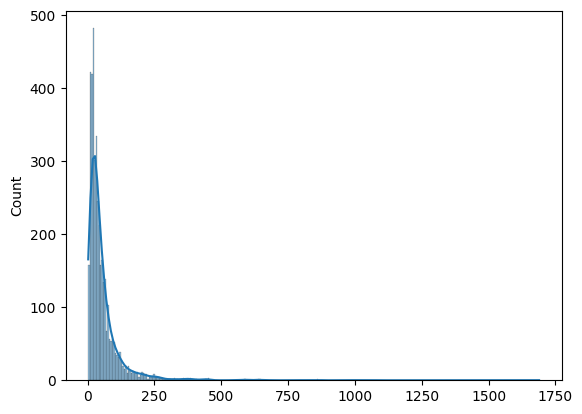

In [ ]:
degreeSub = [drg for node , drg in subgraph.degree()]
sns.histplot(data=degreeSub, kde=True)

## Esparsidade/Densidade da Rede

In [ ]:
nx.density(G)

0.0056568894271159615

### Subgrafo Gerado

In [ ]:
nx.density(subgraph)

0.0068204467118315555

## Assortatividade Geral da Rede

In [ ]:
nx.degree_assortativity_coefficient(G)

-0.05620919781872192

In [ ]:
nx.degree_assortativity_coefficient(G.to_undirected())

-0.11571399381896205

In [ ]:
nx.attribute_assortativity_coefficient(G, 'degree')

0.0015350333004950597

In [ ]:
nx.attribute_assortativity_coefficient(G, 'in_degree')

0.0027773936657300544

In [ ]:
nx.attribute_assortativity_coefficient(G, 'out_degree')

0.0022815524949146124

### Subgrafo Gerado

In [ ]:
nx.degree_assortativity_coefficient(subgraph)

-0.049019586542616254

In [ ]:
nx.degree_assortativity_coefficient(subgraph.to_undirected())

-0.10688610476626349

In [ ]:
nx.attribute_assortativity_coefficient(subgraph, 'degree')

0.0014908867795188226

In [ ]:
nx.attribute_assortativity_coefficient(subgraph, 'in_degree')

0.0023073148918933703

In [ ]:
nx.attribute_assortativity_coefficient(subgraph, 'out_degree')

0.0021450809537942764

##Coeficiente de Clustering Local Para Nós Escolhidos

In [ ]:
clustering = nx.clustering(G)
sorted(clustering.items(), key=lambda item: item[1], reverse=True)

[('Apaochi', 1.0),
 ('Blokus', 1.0),
 ('CPU_cache', 1.0),
 ('Defaka', 1.0),
 ('Earless_seal', 1.0),
 ('Garden_Gnome_Liberation_Front', 1.0),
 ('List_of_Canadian_provinces_and_territories_by_area', 1.0),
 ('Marc_Pugh', 1.0),
 ('Trobairitz', 1.0),
 ('Wikispecies', 1.0),
 ('X_Window_core_protocol', 1.0),
 ('Yotsuya_Kaidan', 1.0),
 ('Zuid-Gelders', 1.0),
 ('Saxicola', 0.9166666666666666),
 ('Ulawun', 0.9),
 ('Democratic_Action_Party', 0.8888888888888888),
 ('El_Aaiún', 0.8888888888888888),
 ('Las_Palmas_de_Gran_Canaria', 0.8888888888888888),
 ('Inductance', 0.8425925925925926),
 ('Architecture_of_Windows_NT', 0.8333333333333334),
 ('Btrieve', 0.8333333333333334),
 ('InterBase', 0.8333333333333334),
 ('Tone_cluster', 0.8333333333333334),
 ('Sandringham_House', 0.7884615384615384),
 ('Tropical_Storm_Zeta_(2005)', 0.7777777777777778),
 ('Senufo_languages', 0.7747252747252747),
 ('Antlion', 0.7666666666666667),
 ('Scattered_disc', 0.75),
 ('GNU_Project', 0.7115384615384616),
 ('Laurent_Fignon'

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], clustering.items()))).describe()

,0
count,4604.000000
mean,0.194941
std,0.125376
min,0.000000
25%,0.111111
50%,0.166667
75%,0.246062
max,1.000000


In [ ]:
max(clustering.items(), key=lambda item: item[1])

('Apaochi', 1.0)

In [ ]:
min(clustering.items(), key=lambda item: item[1])

('Achilles_tendon', 0)

### Subgrafo Gerado

In [ ]:
clusteringSub = nx.clustering(G)
sorted(clusteringSub.items(), key=lambda item: item[1], reverse=True)

[('Apaochi', 1.0),
 ('Blokus', 1.0),
 ('CPU_cache', 1.0),
 ('Defaka', 1.0),
 ('Earless_seal', 1.0),
 ('Garden_Gnome_Liberation_Front', 1.0),
 ('List_of_Canadian_provinces_and_territories_by_area', 1.0),
 ('Marc_Pugh', 1.0),
 ('Trobairitz', 1.0),
 ('Wikispecies', 1.0),
 ('X_Window_core_protocol', 1.0),
 ('Yotsuya_Kaidan', 1.0),
 ('Zuid-Gelders', 1.0),
 ('Saxicola', 0.9166666666666666),
 ('Ulawun', 0.9),
 ('Democratic_Action_Party', 0.8888888888888888),
 ('El_Aaiún', 0.8888888888888888),
 ('Las_Palmas_de_Gran_Canaria', 0.8888888888888888),
 ('Inductance', 0.8425925925925926),
 ('Architecture_of_Windows_NT', 0.8333333333333334),
 ('Btrieve', 0.8333333333333334),
 ('InterBase', 0.8333333333333334),
 ('Tone_cluster', 0.8333333333333334),
 ('Sandringham_House', 0.7884615384615384),
 ('Tropical_Storm_Zeta_(2005)', 0.7777777777777778),
 ('Senufo_languages', 0.7747252747252747),
 ('Antlion', 0.7666666666666667),
 ('Scattered_disc', 0.75),
 ('GNU_Project', 0.7115384615384616),
 ('Laurent_Fignon'

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], clusteringSub.items()))).describe()

,0
count,4604.000000
mean,0.194941
std,0.125376
min,0.000000
25%,0.111111
50%,0.166667
75%,0.246062
max,1.000000


In [ ]:
sorted(clusteringSub.items(), key=lambda item: item[1], reverse=True)[:5]

[('Apaochi', 1.0),
 ('Blokus', 1.0),
 ('CPU_cache', 1.0),
 ('Defaka', 1.0),
 ('Earless_seal', 1.0)]

In [ ]:
max(clusteringSub.items(), key=lambda item: item[1])

('Apaochi', 1.0)

In [ ]:
sorted(clusteringSub.items(), key=lambda item: item[1])[:5]

[('Achilles_tendon', 0),
 ('All_your_base_are_belong_to_us', 0),
 ('Amaranth_oil', 0),
 ('Animal_law', 0),
 ('Autobianchi_Primula', 0)]

In [ ]:
min(clusteringSub.items(), key=lambda item: item[1])

('Achilles_tendon', 0)

##Coeficiente de Clustering Global

In [ ]:
clustering_coefficient = sum(clustering.values())/len(clustering)
clustering_coefficient

0.1949406447065974

### Subgrafo Gerado

In [ ]:
clustering_coefficient = sum(clusteringSub.values())/len(clusteringSub)
clustering_coefficient

0.1949406447065974

##Degree Centrality

In [ ]:
def print_graph(G, color):
  fig, ax = plt.subplots(1,1,figsize=(10,8))

  pos = nx.spring_layout(G)

  nx.draw_networkx_edges(G,
                        pos=pos,
                        alpha=0.4, ax=ax)

  nodes = nx.draw_networkx_nodes(G,
                  pos=pos,
                  node_color=color,
                  cmap=plt.cm.jet,
                  ax=ax)

  # nx.draw_networkx_labels(G, pos=pos,
  #                         font_color='white',
  #                         font_size = 5,
  #                         ax=ax)


  plt.axis("off")
  plt.colorbar(nodes)
  plt.show()

In [ ]:
degree_centrality = dict(nx.degree_centrality(G))
sorted(degree_centrality.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.40082554855529),
 ('United_Kingdom', 0.24766456658700847),
 ('Europe', 0.23723658483597654),
 ('France', 0.2268086030849446),
 ('England', 0.2005213990875516),
 ('Germany', 0.19813165326960677),
 ('World_War_II', 0.18900716923745384),
 ('English_language', 0.15555072778622636),
 ('India', 0.1503367369107104),
 ('Africa', 0.1496849880512709),
 ('London', 0.1496849880512709),
 ('Japan', 0.14577449489463393),
 ('Australia', 0.14099500325874428),
 ('Italy', 0.13795350858135996),
 ('Canada', 0.13773625896154681),
 ('Spain', 0.13643276124266782),
 ('Russia', 0.13578101238322832),
 ('China', 0.12730827721051488),
 ('Scientific_classification', 0.11818379317836193),
 ('Animal', 0.11318705192265913),
 ('Asia', 0.10732131218770366),
 ('North_America', 0.10580056484901151),
 ('World_War_I', 0.10558331522919834),
 ('Latin', 0.10254182055181403),
 ('Netherlands', 0.09950032587442971),
 ('19th_century', 0.09841407777536389),
 ('List_of_countries_by_system_of_government', 0.09841

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], degree_centrality.items()))).describe()

,0
count,4604.000000
mean,0.011314
std,0.017065
min,0.000000
25%,0.003476
50%,0.006517
75%,0.012818
max,0.400826


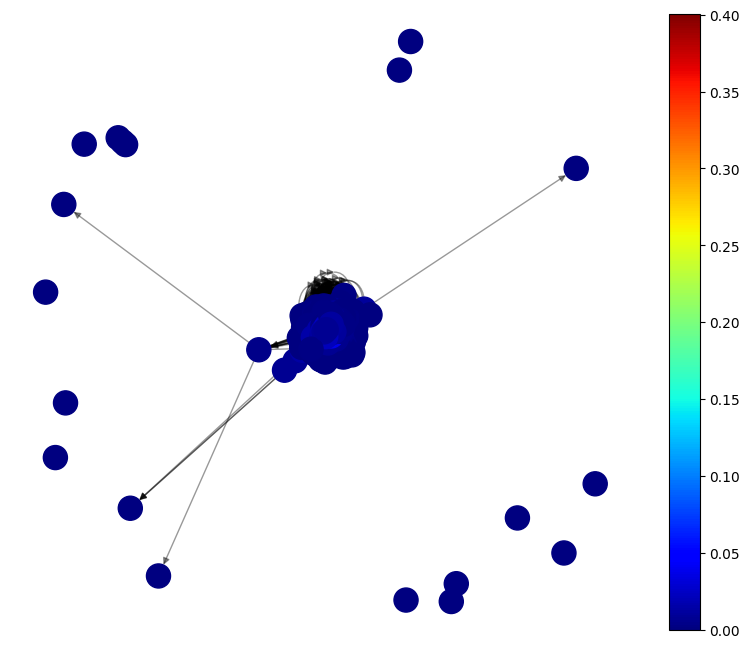

In [ ]:
print_graph(G, list(degree_centrality.values()))

### Subgrafo Gerado

In [ ]:
degree_centrality_subgraph = dict(nx.degree_centrality(subgraph))
sorted(degree_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.41703703703703704),
 ('United_Kingdom', 0.2632098765432099),
 ('Europe', 0.24839506172839507),
 ('France', 0.2402469135802469),
 ('England', 0.2125925925925926),
 ('Germany', 0.21209876543209877),
 ('World_War_II', 0.19876543209876543),
 ('English_language', 0.16641975308641976),
 ('India', 0.15901234567901235),
 ('Africa', 0.15876543209876542),
 ('Japan', 0.15728395061728395),
 ('London', 0.15728395061728395),
 ('Australia', 0.14938271604938272),
 ('Italy', 0.14617283950617285),
 ('Russia', 0.1451851851851852),
 ('Spain', 0.1451851851851852),
 ('Canada', 0.14469135802469135),
 ('China', 0.13481481481481483),
 ('Asia', 0.11259259259259259),
 ('List_of_countries_by_system_of_government', 0.11135802469135803),
 ('Latin', 0.11111111111111112),
 ('World_War_I', 0.11111111111111112),
 ('North_America', 0.10987654320987654),
 ('Scientific_classification', 0.10987654320987654),
 ('19th_century', 0.1088888888888889),
 ('Netherlands', 0.10814814814814815),
 ('Animal', 0.106

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], degree_centrality_subgraph.items()))).describe()

,0
count,4051.000000
mean,0.013641
std,0.019045
min,0.000494
25%,0.004691
50%,0.008395
75%,0.015556
max,0.417037


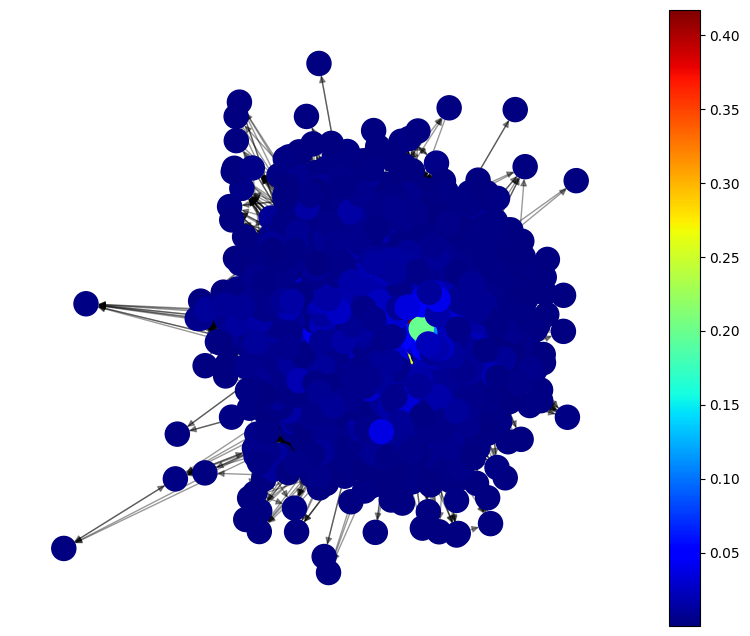

In [ ]:
print_graph(subgraph, list(degree_centrality_subgraph.values()))

In [ ]:
indegree_centrality_subgraph = dict(nx.in_degree_centrality(subgraph))
sorted(indegree_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], indegree_centrality_subgraph.items()))).describe()

,0
count,4051.000000
mean,0.006820
std,0.015012
min,0.000247
25%,0.000988
50%,0.002469
75%,0.006914
max,0.344444


In [ ]:
outdegree_centrality_subgraph = dict(nx.out_degree_centrality(subgraph))
sorted(indegree_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], outdegree_centrality_subgraph.items()))).describe()

,0
count,4051.000000
mean,0.006820
std,0.006063
min,0.000247
25%,0.002963
50%,0.005185
75%,0.008642
max,0.072593


##Closeness Centrality

In [ ]:
closeness_centrality = dict(nx.closeness_centrality(G))
sorted(closeness_centrality.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.5888144495179611),
 ('Europe', 0.5413350441257859),
 ('United_Kingdom', 0.5400542324751866),
 ('France', 0.5383982105334064),
 ('Germany', 0.5229184910782076),
 ('World_War_II', 0.5220812473825197),
 ('Latin', 0.5121245711367234),
 ('English_language', 0.5118948673595821),
 ('India', 0.5118948673595821),
 ('England', 0.5102926925008666),
 ('Japan', 0.5085871687959841),
 ('Canada', 0.5048748536952834),
 ('Italy', 0.504094349283652),
 ('China', 0.5018775755401004),
 ('Russia', 0.5005568450781527),
 ('Spain', 0.5003922423668478),
 ('Australia', 0.4989156750942899),
 ('French_language', 0.4877741668033714),
 ('London', 0.4871495493664233),
 ('United_Nations', 0.4862674080861475),
 ('North_America', 0.48616383675322183),
 ('Netherlands', 0.4860085624521189),
 ('Africa', 0.4852336763512705),
 ('Islam', 0.4843584538050666),
 ('World_War_I', 0.482056856083712),
 ('Christianity', 0.48068636696985917),
 ("People's_Republic_of_China", 0.47937398163527806),
 ('Time_zone', 0.47

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], closeness_centrality.items()))).describe()

,0
count,4604.000000
mean,0.283347
std,0.117359
min,0.000000
25%,0.262052
50%,0.312644
75%,0.352918
max,0.588814


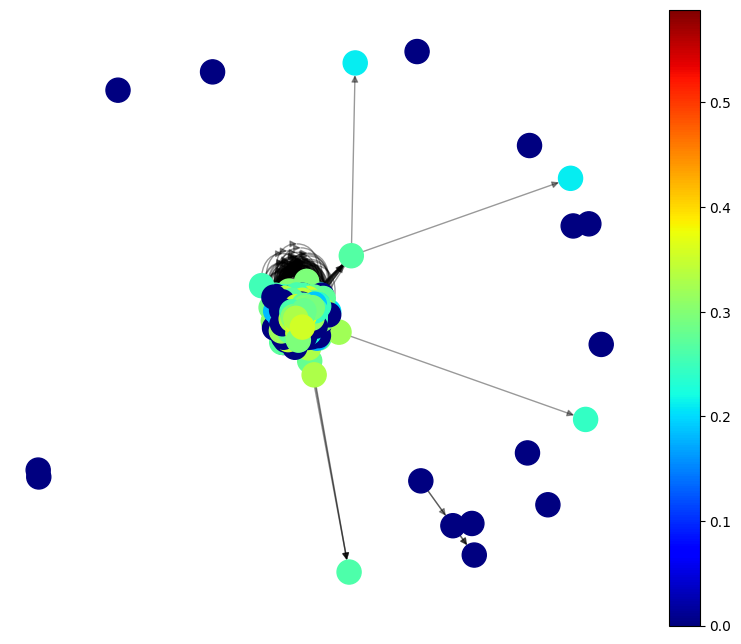

In [ ]:
print_graph(G, list(closeness_centrality.values()))

### Subgrafo Gerado

In [ ]:
closeness_centrality_subgraph = dict(nx.closeness_centrality(subgraph))
sorted(closeness_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.5951506245407788),
 ('Europe', 0.5468539022414258),
 ('United_Kingdom', 0.5467800729040098),
 ('France', 0.5453076612360307),
 ('Germany', 0.5305213518470002),
 ('World_War_II', 0.52858261550509),
 ('English_language', 0.5182341650671785),
 ('India', 0.5181678607983623),
 ('Latin', 0.5179690497506075),
 ('England', 0.5172413793103449),
 ('Japan', 0.5152671755725191),
 ('Canada', 0.5113636363636364),
 ('Italy', 0.5105256523383336),
 ('China', 0.5078369905956113),
 ('Russia', 0.5077733199598796),
 ('Spain', 0.5066933566871012),
 ('Australia', 0.5065666041275797),
 ('London', 0.4936014625228519),
 ('French_language', 0.49354131123568123),
 ('United_Nations', 0.49204227918843396),
 ('Africa', 0.4918032786885246),
 ('Netherlands', 0.49138558602281),
 ('North_America', 0.49061175045427013),
 ('Islam', 0.48942598187311176),
 ('World_War_I', 0.4883636802122272),
 ('Christianity', 0.48707155742633795),
 ("People's_Republic_of_China", 0.48508803449514915),
 ('Time_zone', 0.4

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], closeness_centrality_subgraph.items()))).describe()

,0
count,4051.000000
mean,0.325279
std,0.058280
min,0.145988
25%,0.283445
50%,0.327564
75%,0.362011
max,0.595151


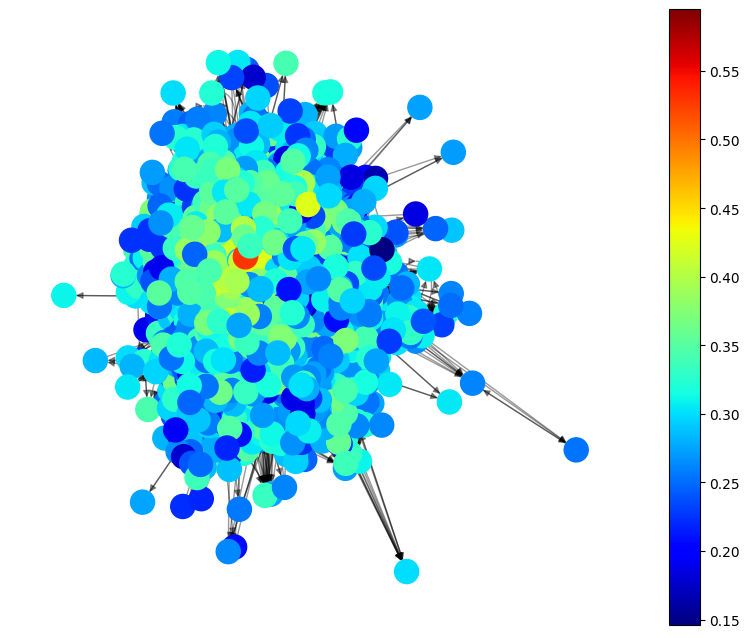

In [ ]:
print_graph(subgraph, list(closeness_centrality_subgraph.values()))

##Betweenness Centrality

In [ ]:
betweenness_centrality = dict(nx.betweenness_centrality(G))
sorted(betweenness_centrality.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.09360037318221959),
 ('United_Kingdom', 0.04216372076999777),
 ('England', 0.03223406679869186),
 ('Europe', 0.02685113319524297),
 ('Africa', 0.024078126662500234),
 ('Germany', 0.019307525351336053),
 ('World_War_II', 0.015418880372058083),
 ('19th_century', 0.014746616150219575),
 ('London', 0.014598946145777862),
 ('English_language', 0.013967985319250285),
 ('Earth', 0.013777902088680885),
 ('Japan', 0.012905608235850952),
 ('Australia', 0.012461619454310058),
 ('France', 0.011939388062235384),
 ('India', 0.011197540562254311),
 ('China', 0.010202801532679662),
 ('Russia', 0.009459887826646095),
 ('Canada', 0.00921837134604143),
 ('Asia', 0.008682627609955805),
 ('Human', 0.008643432055313932),
 ('Water', 0.008597910820299209),
 ('Atlantic_Ocean', 0.008442616426557144),
 ('Bird', 0.00840199069689199),
 ('Scotland', 0.008129315425579263),
 ('20th_century', 0.008118641838583051),
 ('Dinosaur', 0.008009432104382442),
 ('Paris', 0.007733481058080307),
 ('Argentina

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], betweenness_centrality.items()))).describe()

,0
count,4604.000000
mean,0.000420
std,0.001968
min,0.000000
25%,0.000006
50%,0.000060
75%,0.000302
max,0.093600


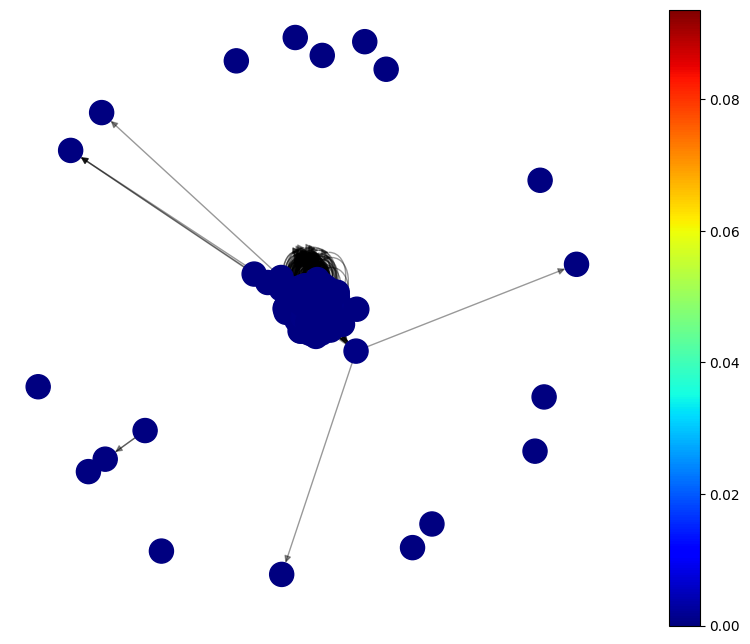

In [ ]:
print_graph(G, list(betweenness_centrality.values()))

### Subgrafo Gerado

In [ ]:
betweenness_centrality_subgraph = dict(nx.betweenness_centrality(subgraph))
sorted(betweenness_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.10360812951695177),
 ('United_Kingdom', 0.04785528190469989),
 ('England', 0.036256938554861895),
 ('Europe', 0.029336568728487892),
 ('Africa', 0.026377025516304487),
 ('Germany', 0.02191642918749236),
 ('19th_century', 0.017125590765730853),
 ('World_War_II', 0.01693965063548964),
 ('London', 0.016294205570957822),
 ('Earth', 0.016246768748071544),
 ('English_language', 0.015196866718145624),
 ('Japan', 0.01464102701711708),
 ('Australia', 0.014165898483653806),
 ('France', 0.013597747117823182),
 ('India', 0.012594427909700483),
 ('China', 0.011322666103967248),
 ('Russia', 0.01069105601468177),
 ('Water', 0.010177793721454352),
 ('Canada', 0.009842096771406402),
 ('Human', 0.009792024415609812),
 ('20th_century', 0.00946922934515999),
 ('Atlantic_Ocean', 0.009414537629937974),
 ('Asia', 0.009318358474874335),
 ('Paris', 0.009171261484933132),
 ('Bird', 0.0091396261580851),
 ('Scotland', 0.009056532625730319),
 ('Dinosaur', 0.008873453903427597),
 ('Argentina', 

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], betweenness_centrality_subgraph.items()))).describe()

,0
count,4051.000000
mean,0.000539
std,0.002334
min,0.000000
25%,0.000017
50%,0.000108
75%,0.000412
max,0.103608


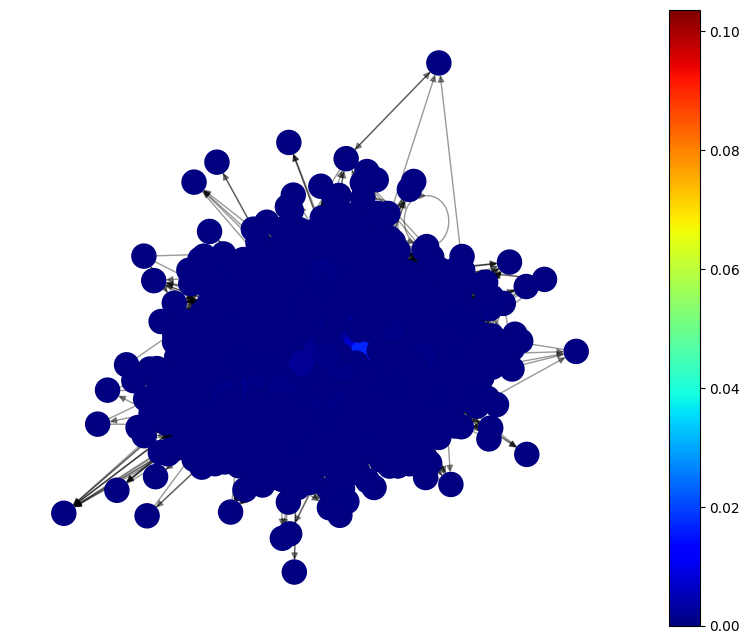

In [ ]:
print_graph(subgraph, list(betweenness_centrality_subgraph.values()))

##Eigenvector Centrality

In [ ]:
eigenvector_centrality = dict(nx.eigenvector_centrality(G))
sorted(eigenvector_centrality.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.20687169802159686),
 ('France', 0.19193513245340302),
 ('United_Kingdom', 0.18311075457529807),
 ('Europe', 0.17500107172194393),
 ('Time_zone', 0.15306381720735104),
 ('Currency', 0.14920627635092742),
 ('Germany', 0.14839762429077785),
 ('World_War_II', 0.14726894566833648),
 ('English_language', 0.14121692519921328),
 ('List_of_countries_by_system_of_government', 0.14076791284337115),
 ('Spain', 0.13375401952888533),
 ('India', 0.12733776826226947),
 ('United_Nations', 0.12688358187849058),
 ('Russia', 0.12533830588902553),
 ('Italy', 0.11921323222915998),
 ('Japan', 0.11139643753420328),
 ('Islam', 0.10945877936407813),
 ('Portugal', 0.10095938696184237),
 ('European_Union', 0.10035295525559984),
 ('Christianity', 0.097288798450091),
 ('Canada', 0.0950762809068457),
 ('French_language', 0.09368160036046734),
 ('China', 0.09330408130021413),
 ('Africa', 0.09325887713698972),
 ('Netherlands', 0.0911525110296466),
 ("People's_Republic_of_China", 0.0910504038736054

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], eigenvector_centrality.items()))).describe()

,0
count,4.604000e+03
mean,5.280449e-03
std,1.376083e-02
min,4.240657e-24
25%,6.969246e-05
50%,8.160799e-04
75%,4.082026e-03
max,2.068717e-01


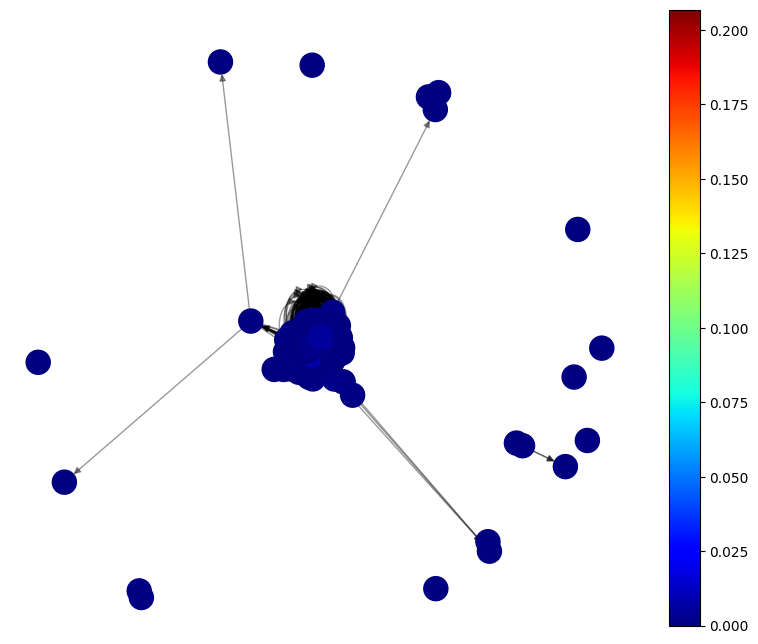

In [ ]:
print_graph(G, list(eigenvector_centrality.values()))

### Subgrafo Gerado

In [ ]:
eigenvector_centrality_subgraph = dict(nx.eigenvector_centrality(subgraph))
sorted(eigenvector_centrality_subgraph.items(), key=lambda items : items[1], reverse=True)

[('United_States', 0.20686352920663192),
 ('France', 0.19193500751727982),
 ('United_Kingdom', 0.18311211548340411),
 ('Europe', 0.1749973481554032),
 ('Time_zone', 0.15307477464864827),
 ('Currency', 0.14921758616093447),
 ('Germany', 0.14839213084384092),
 ('World_War_II', 0.14726573947238414),
 ('English_language', 0.14121879345128513),
 ('List_of_countries_by_system_of_government', 0.14077984276712693),
 ('Spain', 0.1337539630790054),
 ('India', 0.12733892113666057),
 ('United_Nations', 0.12688873002240678),
 ('Russia', 0.12533524871830368),
 ('Italy', 0.1192086953402577),
 ('Japan', 0.11139320287076367),
 ('Islam', 0.10946200327421711),
 ('Portugal', 0.10096396020446377),
 ('European_Union', 0.1003537748778743),
 ('Christianity', 0.09728833666218967),
 ('Canada', 0.09507206005760882),
 ('French_language', 0.09368215901120933),
 ('China', 0.093301216865479),
 ('Africa', 0.09326414928123672),
 ('Netherlands', 0.0911516481397646),
 ("People's_Republic_of_China", 0.09105029825621468),

In [ ]:
pd.DataFrame(list(map(lambda item: item[1], eigenvector_centrality_subgraph.items()))).describe()

,0
count,4.051000e+03
mean,6.001015e-03
std,1.452214e-02
min,2.381207e-10
25%,1.994774e-04
50%,1.272377e-03
75%,4.872457e-03
max,2.068635e-01


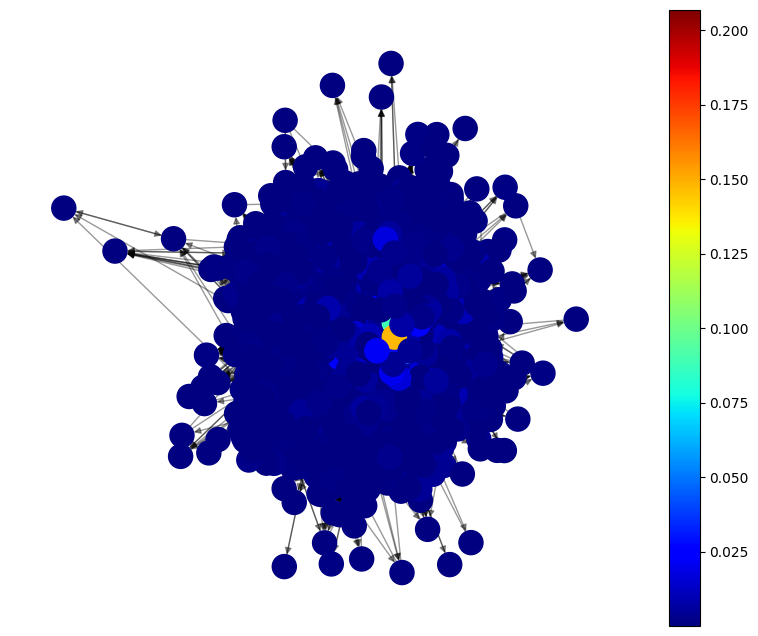

In [ ]:
print_graph(subgraph, list(eigenvector_centrality_subgraph.values()))

## Correlação entre as medidas de centralidade

In [ ]:
measures = [#nx.pagerank(G),
            nx.degree_centrality(G),
            nx.closeness_centrality(G),
            nx.betweenness_centrality(G),
            nx.eigenvector_centrality(G)]

In [ ]:
pd.DataFrame.from_records(measures).T.corr()

,0,1,2,3
0,1.000000,0.448195,0.803212,0.875484
1,0.448195,1.000000,0.241448,0.425248
2,0.803212,0.241448,1.000000,0.632937
3,0.875484,0.425248,0.632937,1.000000


### Subgrafo Gerado

In [ ]:
measures_subgraph = [#nx.pagerank(G),
            nx.degree_centrality(subgraph),
            nx.closeness_centrality(subgraph),
            nx.betweenness_centrality(subgraph),
            nx.eigenvector_centrality(subgraph)]

KeyboardInterrupt: ignored

In [ ]:
pd.DataFrame.from_records(measures_subgraph).T.corr()

,0,1,2,3
0,1.000000,0.656281,0.802265,0.878058
1,0.656281,1.000000,0.378566,0.660206
2,0.802265,0.378566,1.000000,0.631643
3,0.878058,0.660206,0.631643,1.000000


#**Pyvis e Streamlit**

In [ ]:
wikispeedia_network = Network(height="600px", directed=True, width="100%", font_color="black", notebook=True, cdn_resources='in_line')
# wikispeedia_network.from_nx(G)

for row in df_articles.iterrows():
  wikispeedia_network.add_node(unquote(row[1]["article"]))

# for row in df_categories.iterrows():
#   wikispeedia_network.nodes[unquote(row[1]["article"])]["category"].append(unquote(row[1]["category"]))

for row in df_links.iterrows():
  wikispeedia_network.add_edge(unquote(row[1]["linkSource"]), unquote(row[1]["linkTarget"]))

In [ ]:
adj_list = wikispeedia_network.get_adj_list()
adj_list

{'Áedán_mac_Gabráin': {'Bede',
  'Columba',
  'Dál_Riata',
  'Great_Britain',
  'Ireland',
  'Isle_of_Man',
  'Monarchy',
  'Orkney',
  'Picts',
  'Scotland',
  'Wales'},
 'Åland': {'20th_century',
  'Baltic_Sea',
  'Crimean_War',
  'Currency',
  'Euro',
  'European_Union',
  'Finland',
  'League_of_Nations',
  'List_of_countries_by_system_of_government',
  'Nationality',
  'Parliamentary_system',
  'Police',
  'Russia',
  'Stockholm',
  'Sweden',
  'Time_zone',
  'Tourism',
  'United_Kingdom',
  'World_War_II'},
 'Édouard_Manet': {'Absinthe',
  'Beer',
  'Claude_Monet',
  'Diego_Velázquez',
  'Edgar_Allan_Poe',
  'France',
  'Francisco_Goya',
  'Germany',
  'Impressionism',
  'Italy',
  'Landscape',
  'Netherlands',
  'Painting',
  'Paris',
  'Photography',
  'Raphael',
  'Renaissance',
  'Sweden',
  'United_States_dollar',
  'Washington,_D.C.'},
 'Éire': {'Canada',
  'English_language',
  'George_VI_of_the_United_Kingdom',
  'Ireland',
  'Northern_Ireland',
  'Ottawa',
  'Republic_of

In [ ]:
wikispeedia_network_subgraph = Network(height="600px", directed=True, width="100%", font_color="black", notebook=True, cdn_resources='in_line')
wikispeedia_network_subgraph.from_nx(subgraph)

In [ ]:
adj_list_subgraph = wikispeedia_network_subgraph.get_adj_list()
adj_list_subgraph

{'10th_century': {'11th_century',
  '9th_century',
  'Algeria',
  'Beer',
  'Black_Sea',
  'Byzantine_Empire',
  'Dark_Ages',
  'Dublin',
  'France',
  'Germany',
  'Great_Moravia',
  'India',
  'Italy',
  'Khazars',
  'Lion',
  'Maya_civilization',
  'Mexico',
  'Monarchy',
  'Myanmar',
  'Philippines',
  'Poland',
  'Scotland',
  'Solar_System',
  'Sweden',
  'Time',
  'Viking'},
 '11th_century': {'10th_century',
  '12th_century',
  '13th_century',
  '14th_century',
  '15th_century',
  '16th_century',
  '17th_century',
  '18th_century',
  '19th_century',
  '1st_century',
  '1st_century_BC',
  '20th_century',
  '21st_century',
  '2nd_century',
  '3rd_century',
  '4th_century',
  '5th_century',
  '6th_century',
  '7th_century',
  '8th_century',
  '9th_century',
  'Battle_of_Hastings',
  'Byzantine_Empire',
  'Canute_the_Great',
  'China',
  'Crusades',
  'Dark_Ages',
  'Domesday_Book',
  'East-West_Schism',
  'Edward_the_Confessor',
  'England',
  'First_Crusade',
  'France',
  'Ghana'

In [ ]:
for node in wikispeedia_network.nodes:
  node["title"] = " Links: " + " || ".join(adj_list[node["id"]])
  node["degree"] = nx.degree(G, node["id"])
  node["in_degree"] = G.in_degree(node["id"])
  node["out_degree"] = G.out_degree(node["id"])

for node in wikispeedia_network_subgraph.nodes:
  node["title"] = " Links: " + " || ".join(adj_list_subgraph[node["id"]])
  node["degree"] = nx.degree(subgraph, node["id"])
  node["in_degree"] = subgraph.in_degree(node["id"])
  node["out_degree"] = subgraph.out_degree(node["id"])

In [ ]:
wikispeedia_network.show_buttons(filter_=['physics'])
# wikispeedia_network.toggle_physics(False)
wikispeedia_network.show('wikispeedia.html')

In [ ]:
wikispeedia_network_subgraph.show_buttons(filter_=['physics'])
wikispeedia_network_subgraph.show('wikispeedia-subgraph.html')

In [ ]:
with open('/content/wikispeedia-subgraph.html', 'r') as html_file:
  display(HTML(html_file.read()))

`too many nodes --> physics disabled`

###Streamlit app [*here*](https://share.streamlit.io/app/feronando-network-analysis-app-ob38bw/).